****Raport z Eksploracji Danych (EDA)****

**Hubert Ruczyński**

In [1]:
import pandas as pd
from pandas_profiling import ProfileReport
import numpy as np
import sklearn 
from sklearn.datasets import load_boston
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
import warnings
warnings.filterwarnings('ignore')
np.random.seed(23)

**WCZYTANIE DANYCH**

In [2]:
fires_df = pd.read_csv('forest_fires_dataset.csv')
fires_df.head(10)

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
0,7,5,mar,fri,86.2,26.2,94.3,5.1,8.2,51.0,6.7,0.0,0.0
1,7,4,oct,tue,90.6,35.4,669.1,6.7,18.0,33.0,0.9,0.0,0.0
2,7,4,oct,sat,90.6,43.7,686.9,6.7,14.6,33.0,1.3,0.0,0.0
3,8,6,mar,fri,91.7,33.3,77.5,9.0,8.3,97.0,4.0,0.2,0.0
4,8,6,mar,sun,89.3,51.3,102.2,9.6,11.4,99.0,1.8,0.0,0.0
5,8,6,aug,sun,92.3,85.3,488.0,14.7,22.2,29.0,5.4,0.0,0.0
6,8,6,aug,mon,92.3,88.9,495.6,8.5,24.1,27.0,3.1,0.0,0.0
7,8,6,aug,mon,91.5,145.4,608.2,10.7,8.0,86.0,2.2,0.0,0.0
8,8,6,sep,tue,91.0,129.5,692.6,7.0,13.1,63.0,5.4,0.0,0.0
9,7,5,sep,sat,92.5,88.0,698.6,7.1,22.8,40.0,4.0,0.0,0.0


**DEFINICJE KOLUMN**

The Fine Fuel Moisture Code (FFMC) - represents fuel moisture of forest litter fuels under the shade of a forest canopy. It is intended to represent moisture conditions for shaded litter fuels, the equivalent of 16-hour timelag. It ranges from 0-101. Subtracting the FFMC value from 100 can provide an estimate for the equivalent (approximately 10h) fuel moisture content, most accurate when FFMC values are roughly above 80.

The Duff Moisture Code (DMC) - represents fuel moisture of decomposed organic material underneath the litter. System designers suggest that it is represents moisture conditions for the equivalent of 15-day (or 360 hr) timelag fuels. It is unitless and open ended. It may provide insight to live fuel moisture stress.

The Drought Code (DC) - much like the Keetch-Byrum Drought Index, represents drying deep into the soil. It approximates moisture conditions for the equivalent of 53-day (1272 hour) timelag fuels. It is unitless, with a maximum value of 1000. Extreme drought conditions have produced DC values near 800.

The Initial Spread Index (ISI) - is analogous to the NFDRS Spread Component (SC). It integrates fuel moisture for fine dead fuels and surface windspeed to estimate a spread potential. ISI is a key input for fire behavior predictions in the FBP system. It is unitless and open ended.

In [3]:
print(fires_df.isnull().sum())

X        0
Y        0
month    0
day      0
FFMC     0
DMC      0
DC       0
ISI      0
temp     0
RH       0
wind     0
rain     0
area     0
dtype: int64


**DANE**

Zauważmy, że dane są kompletne co oznacza, że nie ma w nich żadnych wartości NaN.

Z ciekawości sprawdźmy typy naszych danych, aby wiedzieć na czym możemy operować lub co przekształcać.

In [4]:
fires_df.dtypes

X          int64
Y          int64
month     object
day       object
FFMC     float64
DMC      float64
DC       float64
ISI      float64
temp     float64
RH       float64
wind     float64
rain     float64
area     float64
dtype: object

Jako, że dzień i miesiąc są nieporównywalne jako object, a można z nich wywnioskować ciekawe rzeczy, to zamieńmy je na liczby naturalne.

In [5]:
month = {'jan':1, 'feb':2, 'mar':3, 'apr':4, 'may':5, 'jun':6, 'jul':7, 'aug':8, 'sep':9,'oct':10, 'nov':11,'dec':12}
fires_df.month = fires_df.month.map(month)
day = {'mon':1, 'tue':2, 'wed':3, 'thu':4, 'fri':5, 'sat':6, 'sun':7}
fires_df.day = fires_df.day.map(day)

In [6]:
fires_df

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
0,7,5,3,5,86.2,26.2,94.3,5.1,8.2,51.0,6.7,0.0,0.00
1,7,4,10,2,90.6,35.4,669.1,6.7,18.0,33.0,0.9,0.0,0.00
2,7,4,10,6,90.6,43.7,686.9,6.7,14.6,33.0,1.3,0.0,0.00
3,8,6,3,5,91.7,33.3,77.5,9.0,8.3,97.0,4.0,0.2,0.00
4,8,6,3,7,89.3,51.3,102.2,9.6,11.4,99.0,1.8,0.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
512,4,3,8,7,81.6,56.7,665.6,1.9,27.8,32.0,2.7,0.0,6.44
513,2,4,8,7,81.6,56.7,665.6,1.9,21.9,71.0,5.8,0.0,54.29
514,7,4,8,7,81.6,56.7,665.6,1.9,21.2,70.0,6.7,0.0,11.16
515,1,4,8,6,94.4,146.0,614.7,11.3,25.6,42.0,4.0,0.0,0.00


Sprawdźmy też czy dane nie zawierają zduplikowanych rekordów, które mogłyby zaburzyć wyniki analizy.

In [7]:
fires_df.shape

(517, 13)

In [8]:
duplicate_rows_df = fires_df[fires_df.duplicated()]
print('number of duplicate rows: ', duplicate_rows_df.shape)

number of duplicate rows:  (4, 13)


Mało wierszy jest zduplikowanych więc nie będziemy nic usuwać.

In [9]:
fires_df.count()

X        517
Y        517
month    517
day      517
FFMC     517
DMC      517
DC       517
ISI      517
temp     517
RH       517
wind     517
rain     517
area     517
dtype: int64

Przeanalizujmy teraz korelacje poszczególnych zmiennych, aby ustalić które dane są warte do wybrania do uczenia maszynowego.

,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
FFMC,1.000000,0.382619,0.330512,0.531805,0.431532,-0.300995,-0.028485,0.056702,0.040122
DMC,0.382619,1.000000,0.682192,0.305128,0.469594,0.073795,-0.105342,0.074790,0.072994
DC,0.330512,0.682192,1.000000,0.229154,0.496208,-0.039192,-0.203466,0.035861,0.049383
ISI,0.531805,0.305128,0.229154,1.000000,0.394287,-0.132517,0.106826,0.067668,0.008258
temp,0.431532,0.469594,0.496208,0.394287,1.000000,-0.527390,-0.227116,0.069491,0.097844
RH,-0.300995,0.073795,-0.039192,-0.132517,-0.527390,1.000000,0.069410,0.099751,-0.075519
wind,-0.028485,-0.105342,-0.203466,0.106826,-0.227116,0.069410,1.000000,0.061119,0.012317
rain,0.056702,0.074790,0.035861,0.067668,0.069491,0.099751,0.061119,1.000000,-0.007366
area,0.040122,0.072994,0.049383,0.008258,0.097844,-0.075519,0.012317,-0.007366,1.000000


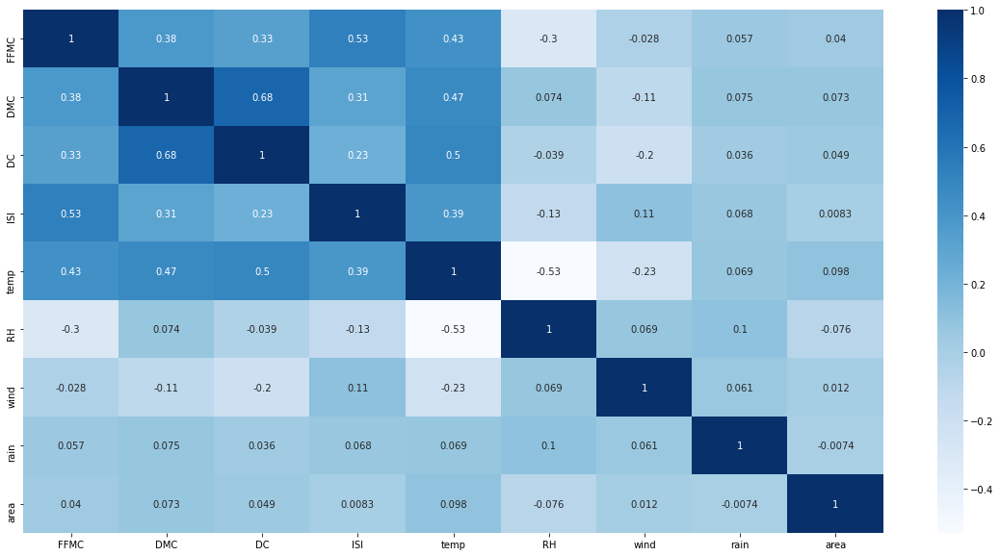

In [10]:
plt.figure(figsize=(20,10))
fires_df_noXY=fires_df.iloc[:,4:13]
fires_df_noXY
c= fires_df_noXY.corr()
sns.heatmap(c,cmap='Blues',annot=True)
c

**Wnioski:**

Okazuje się, że DMC i DC (czyli coś co określa wilgotność paliwa i susze) są bardzo mocno skorelowane.

Ponadto susze są także mocno zależne od temperatur, zaś temperatura ze względną wilgotonością. 

Widzimy, też silną korelację między FFMC oraz ISI (gdzie ISI jest współczynnikiem bardzo zwiększającym ryzyko pożaru)

Sprawdźmy jak wyglądają dwie najsilniejsze korelacje, na wykresach.

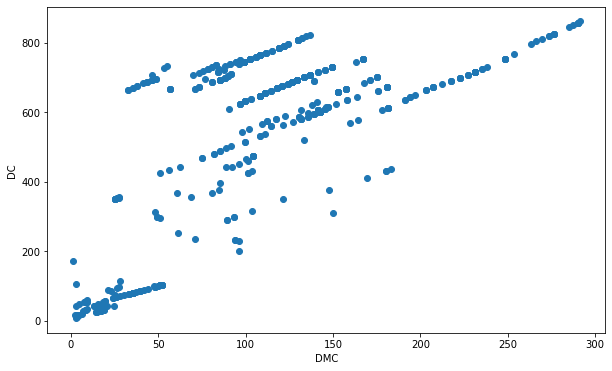

In [11]:
fig, ax = plt.subplots(figsize=(10,6))
ax.scatter(fires_df["DMC"], fires_df["DC"])
ax.set_xlabel("DMC")
ax.set_ylabel("DC")
plt.show()

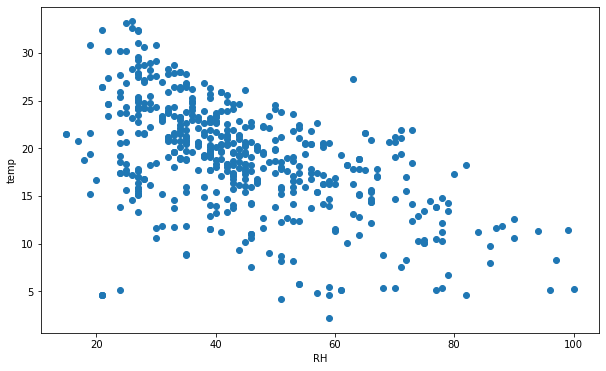

In [12]:
fig, ax = plt.subplots(figsize=(10,6))
ax.scatter(fires_df["RH"], fires_df["temp"])
ax.set_xlabel("RH")
ax.set_ylabel("temp")
plt.show()

W szczególności na pierwszym wykresie bardzo fajnie widać jest korelację (liniową) między oboma zmiennymi, chociaż w drugim także tendencja jest bardzo wyraźna.

**Spalone obszary**
Przeanalizujmy też, które obszary najbardziej ucierpiały w pożarach zawartych w danych.

In [13]:
areas_df=fires_df.iloc[:,[0,1,12]]
areas_df=areas_df.groupby(['X','Y'])['area'].sum().reset_index()
areas_df

,X,Y,area
0,1,2,219.94
1,1,3,157.14
2,1,4,150.28
3,1,5,115.47
4,2,2,462.65
5,2,3,0.00
6,2,4,143.37
7,2,5,92.63
8,3,3,6.58
9,3,4,126.35


Text(0, 0.5, 'Y')

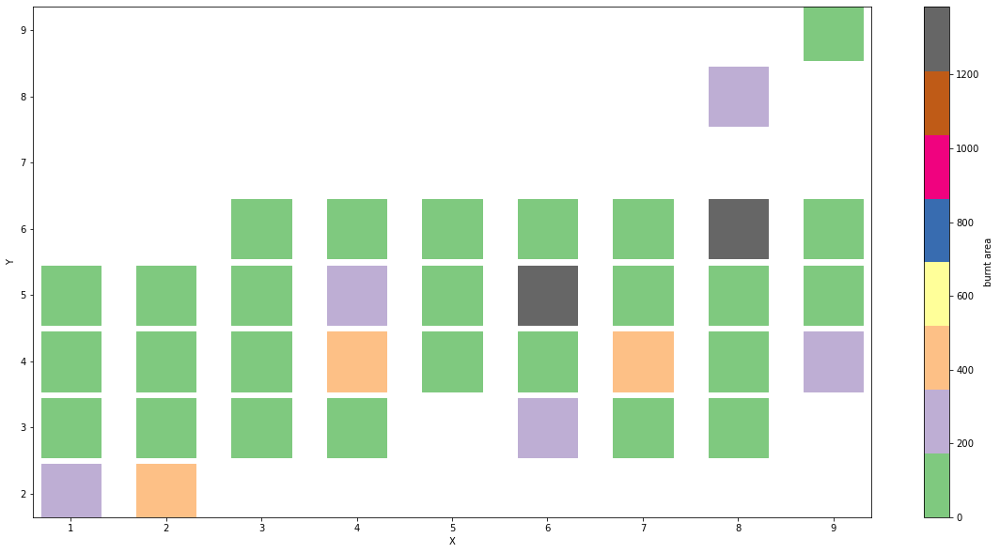

In [34]:
plt.figure(figsize=(20,10))

plt.scatter(areas_df['X'],areas_df['Y'], c=areas_df['area'], cmap='Accent', marker='s', s=4000)
cb = plt.colorbar()
cb.set_label('burnt area')
plt.xlabel('X')
plt.ylabel('Y')

Na powyższym wykresie widać jak bardzo ucierpiały poszczególne obszary. Biały kolor oznacza, że dany obszar nie był w podanych danych.

**SCATTER PLOTS**

Dokonajmy teraz analizy pomiędzy różnymi zmiennymi w parach.

Na początku zbadajmy zależności zmiennych od miesięcy. Aby znaleźć jakieś ciekawsze tendencje do przedstawienia narysujmy wykresy punktowe dla wszystkich zmiennych

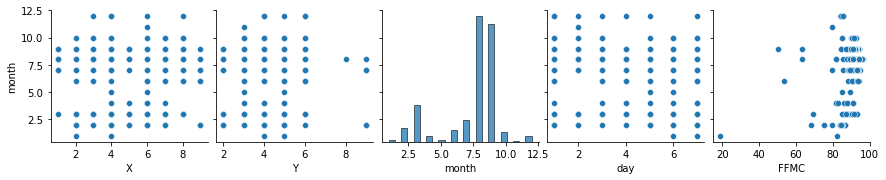

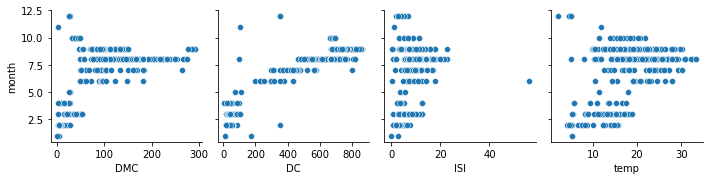

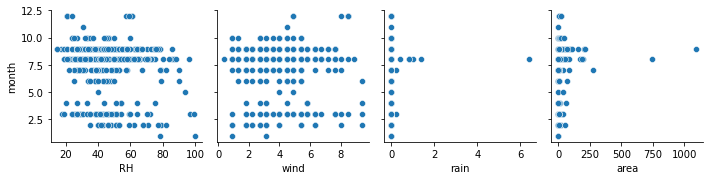

In [29]:
sns.pairplot(fires_df, y_vars="month", x_vars=fires_df.columns.values[0:5])
sns.pairplot(fires_df, y_vars="month", x_vars=fires_df.columns.values[5:9])
sns.pairplot(fires_df, y_vars="month", x_vars=fires_df.columns.values[9:])

plt.show()

Przyjżyjmy się najciekawszym zależnością, tj. miesiąca od:

<AxesSubplot:xlabel='month', ylabel='DMC'>

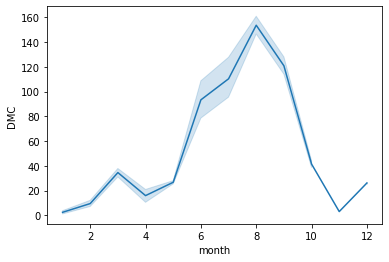

In [16]:
sns.lineplot(data=fires_df, x="month", y='DMC')

<AxesSubplot:xlabel='month', ylabel='DC'>

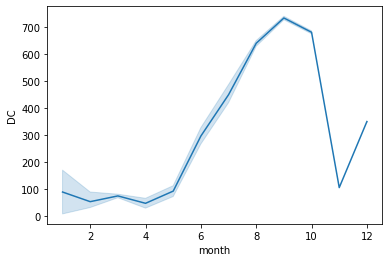

In [17]:
sns.lineplot(data=fires_df, x="month", y='DC')

Na pierwszy rzut oka podobieństwo wykresów susz oraz wilgotności paliwa wydaje się dziwna, jednak w obu przypadkach wskaźniki te mają wartości od 0 do 1000, więc możemy zauważyć, że wilgotność jest w ostateczności kilka razy mniejsza.

<AxesSubplot:xlabel='month', ylabel='ISI'>

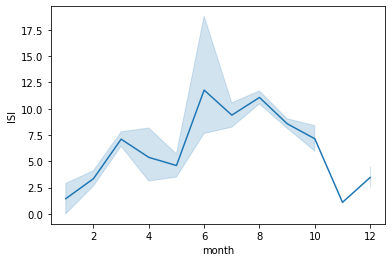

In [18]:
sns.lineplot(data=fires_df, x="month", y='ISI')

<AxesSubplot:xlabel='month', ylabel='temp'>

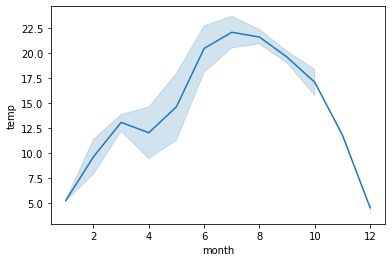

In [19]:
sns.lineplot(data=fires_df, x="month", y='temp')

<AxesSubplot:xlabel='month', ylabel='RH'>

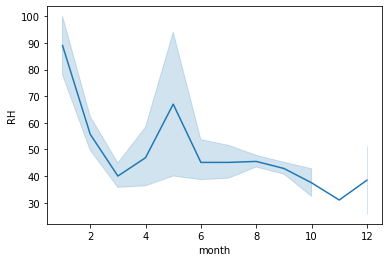

In [20]:
sns.lineplot(data=fires_df, x="month", y='RH')

<AxesSubplot:xlabel='month', ylabel='area'>

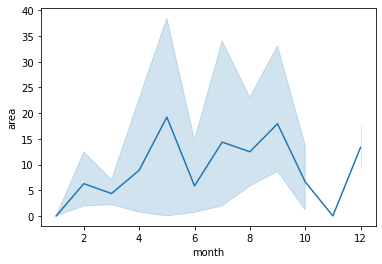

In [21]:
sns.lineplot(data=fires_df, x="month", y='area')

Z powyższych wykresów wynikają takie oczywiste rzeczy jak to, że wskaźniki wilgotności, suchości, temperatury i szansy na pożar są większe w okresie letnim niż w resztę roku oraz, że istotnie dochodzi wtedy do większej liczby pożarów.

Zaskakujące jest jednak to, że ogromne obszary zostają spalone wiosną, gdzie wilgotność względna jest bardzo wysoka, zaśwspółczynniki odpowiadające za zwiększenie ryzyka pożarów mają mniejsze wartości.

Sprawdźmy też zależności obszarów spalonych do reszty zmiennych.

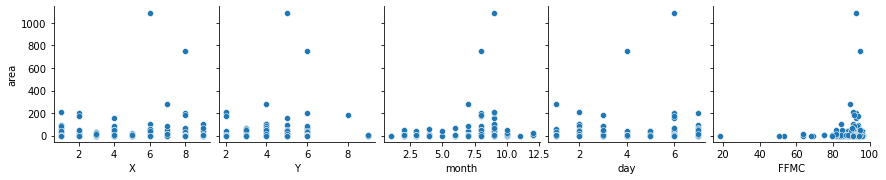

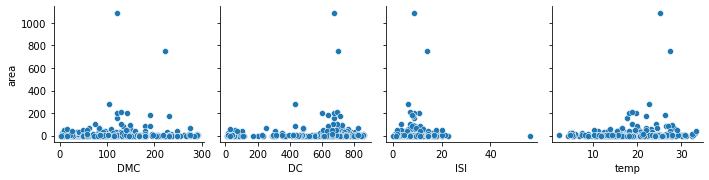

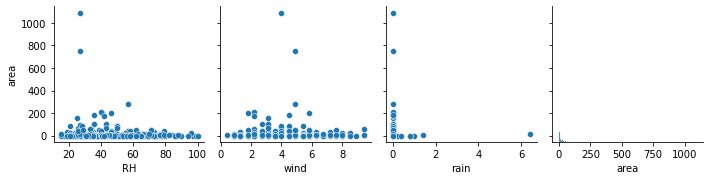

In [27]:
sns.pairplot(fires_df, y_vars="area", x_vars=fires_df.columns.values[0:5])
sns.pairplot(fires_df, y_vars="area", x_vars=fires_df.columns.values[5:9])
sns.pairplot(fires_df, y_vars="area", x_vars=fires_df.columns.values[9:])

plt.show()

Zauważmy, że dwa rekordy bardzo zabużają nam wykresy, stąd aby przyjrzeć się temu lepiej, postanowiłem je usunąć.

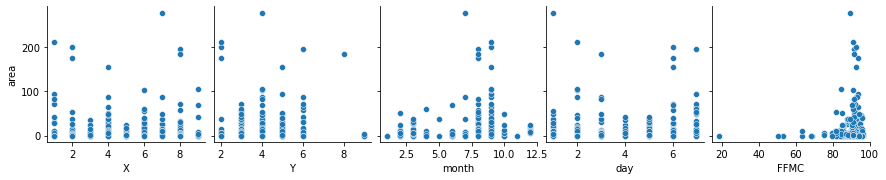

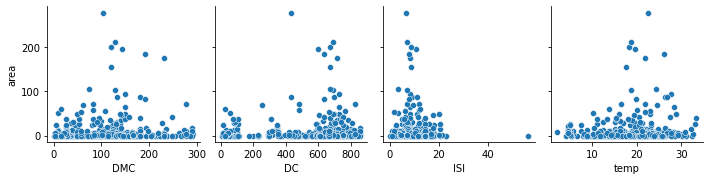

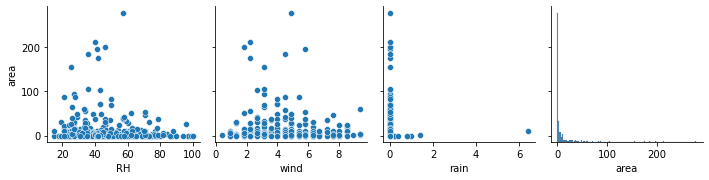

In [28]:
modified_fires_df = fires_df.loc[fires_df['area'] < 500]
sns.pairplot(modified_fires_df, y_vars="area", x_vars=modified_fires_df.columns.values[:5])
sns.pairplot(modified_fires_df, y_vars="area", x_vars=modified_fires_df.columns.values[5:9])
sns.pairplot(modified_fires_df, y_vars="area", x_vars=modified_fires_df.columns.values[9:])
plt.show()

Z powyższej analizy wynika, że: 
- Największe obszary spalają się późnym latem (lipiec-wrzesień)
- W środku tygodnia (czwartek - piątek) dochodzi najmniejszej liczby pożarów
- Przy mniejszej wilgotności dochodzi do większej liczby pożarów
- Im wyższa temperatura, bądź wskaźnik susz, tym większe obszary lasów płoną
- Paradoksalnie to słabszy wiatr powoduje większą ilość spalonych obszarów

**Pandas Profiling Report**

Zobaczmy też jak działa narzędzie do automatycznego generowania raportów wspomniane w nagłówku.

In [26]:
profile = ProfileReport(fires_df, title="Pandas Profiling Report")
profile

Zalety:
- Szybkie i proste wygenerowanie dużej liczby informacji na temat zbioru
- Bardzo przydatne przy określaniu duplikatów, brakujących danych

Wady:
- Przejście przez wszystkie dane zajmuje czytelnikowi bardzo dużo czasu, gdzie tworząc je samemu lepiej orientuje się co jest dla niego ważne
- Nadmiar danych powoduje problemy z odnalezieniem tych interesujących
- Bezmyślne wykonywanie analiz (jak w przypadku heatmapy korelacji) może prowadzić do wysnucia błędnych wniosków

Wniosek:

Bardzo przyjemne narzędzie do wygenerowania raportu wstępnego. Jest to coś naprawdę wygodnego, jednakże nie można oprzećswojej eksploracji jedynie na nim, gdyż jest on niepełny. Należy dokonać na jego podstawie dokładniejszej analizy.